In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

## Importing the important NLP libraries

In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize,sent_tokenize
nltk.download('punkt')
nltk.download('stopwords')
from nltk.stem import PorterStemmer

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
train = pd.read_csv('/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/train_data.txt', sep=':::', engine='python', names=['Id', 'Title','Genre' ,'Description'])
test=pd.read_csv('/kaggle/input/genre-classification-dataset-imdb/Genre Classification Dataset/test_data_solution.txt', sep=':::', engine='python', names=['Id', 'Title','Genre' ,'Description'])

In [4]:
df=pd.concat([train,test])

In [5]:
df.shape

(108414, 4)

In [6]:
df.isnull().sum()

Id             0
Title          0
Genre          0
Description    0
dtype: int64

In [7]:
df.duplicated().sum()

0

In [8]:
import re
import string

def clean_words(text):
    text = text.lower()
    sentences = sent_tokenize(text)
    sw = set(stopwords.words('english'))
    stemmer = PorterStemmer()  # Initialize the stemmer
    list_words = [word_tokenize(sentence) for sentence in sentences]
    
    cleaned_words = [
        re.sub(r'-(?=\w)', ' ', stemmer.stem(word))
        for words in list_words
        for word in words
        if word not in sw and word not in string.punctuation
    ]
    
    return " ".join(cleaned_words)

In [9]:
df['Clean Words']=df['Description'].apply(clean_words)

# EDA

In [10]:
def plotpie(train):
    genre_counts = train['Genre'].value_counts()
    wedges, texts, autotexts = plt.pie(genre_counts, labels=None, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.legend(wedges, genre_counts.index, title='Genres', loc='best')
    plt.title('Distribution of Genres')
    plt.show()

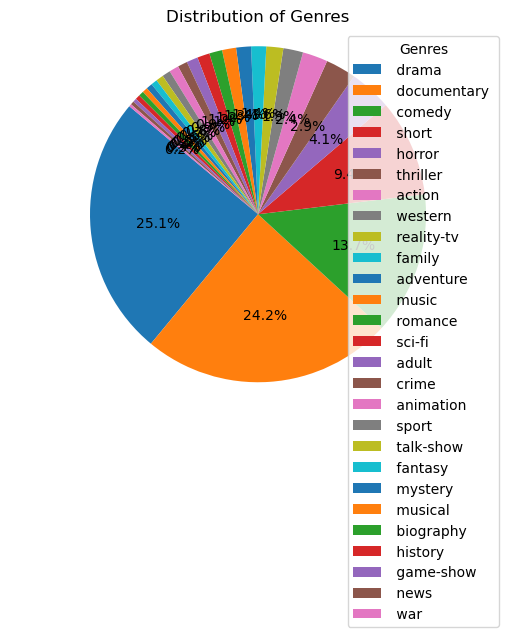

In [11]:
plotpie(df)

In [12]:
from wordcloud import WordCloud

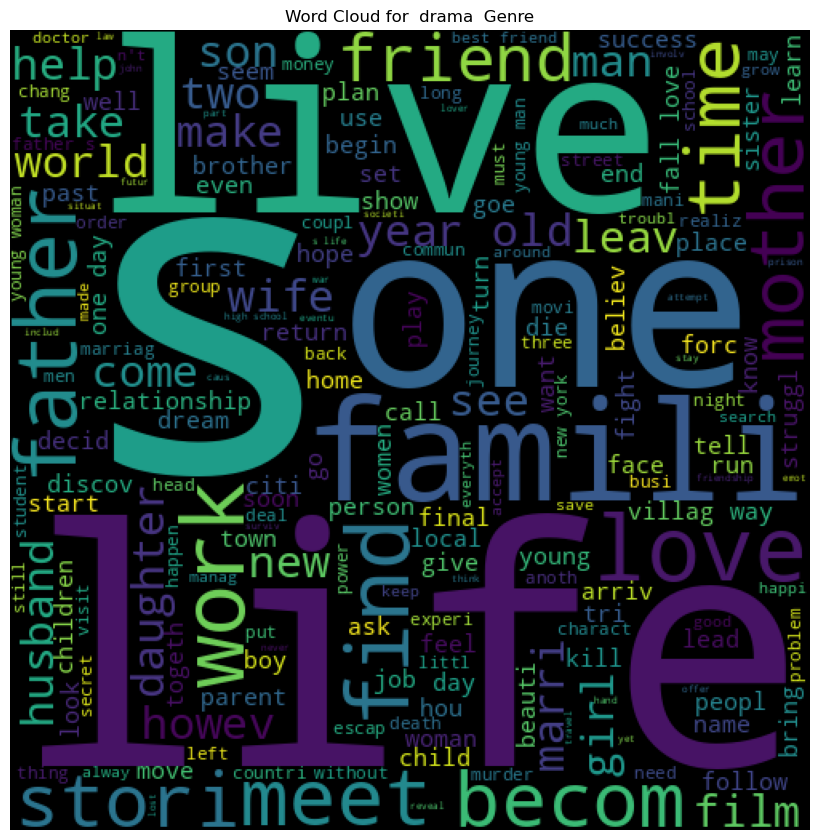

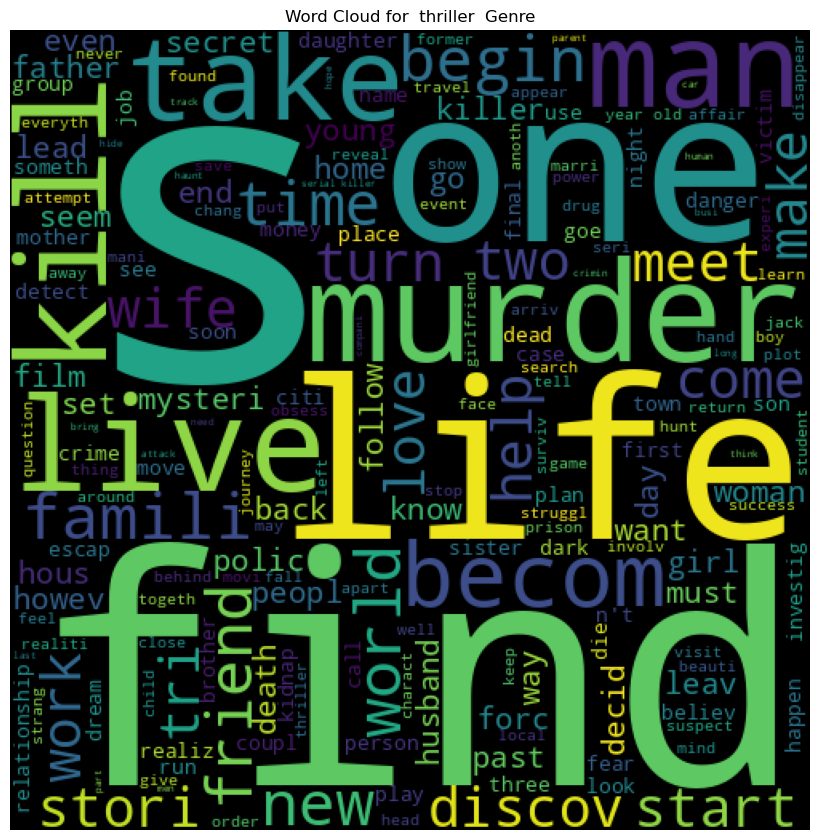

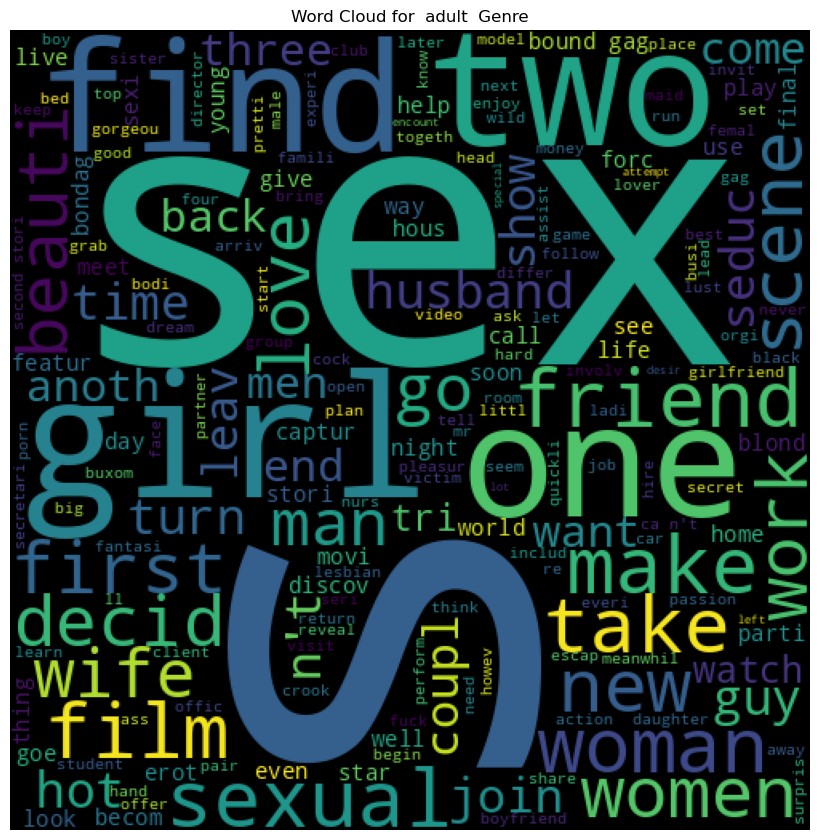

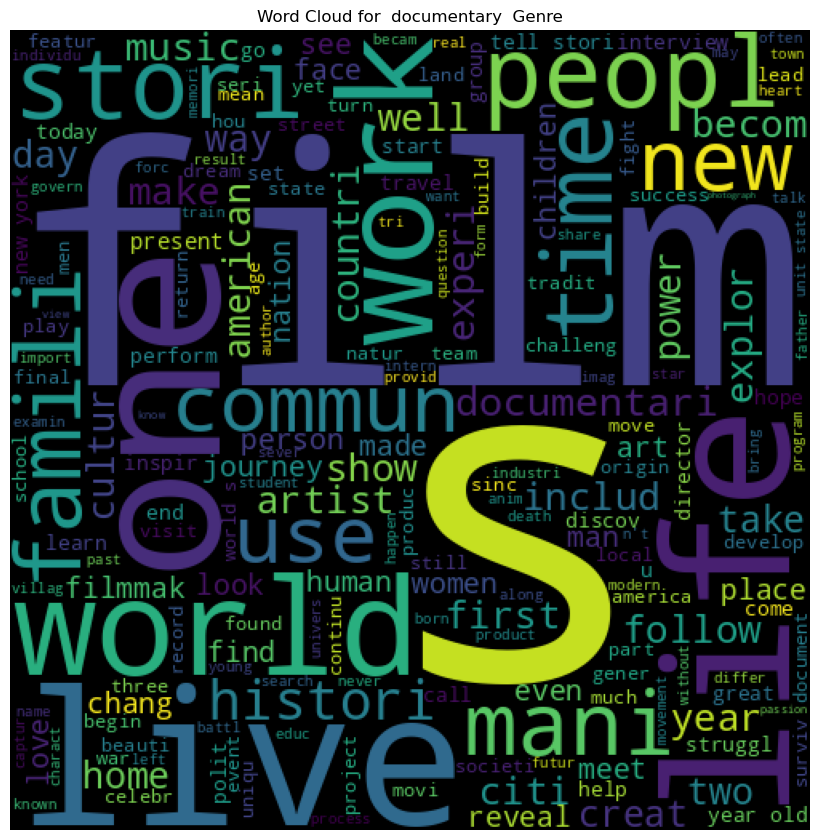

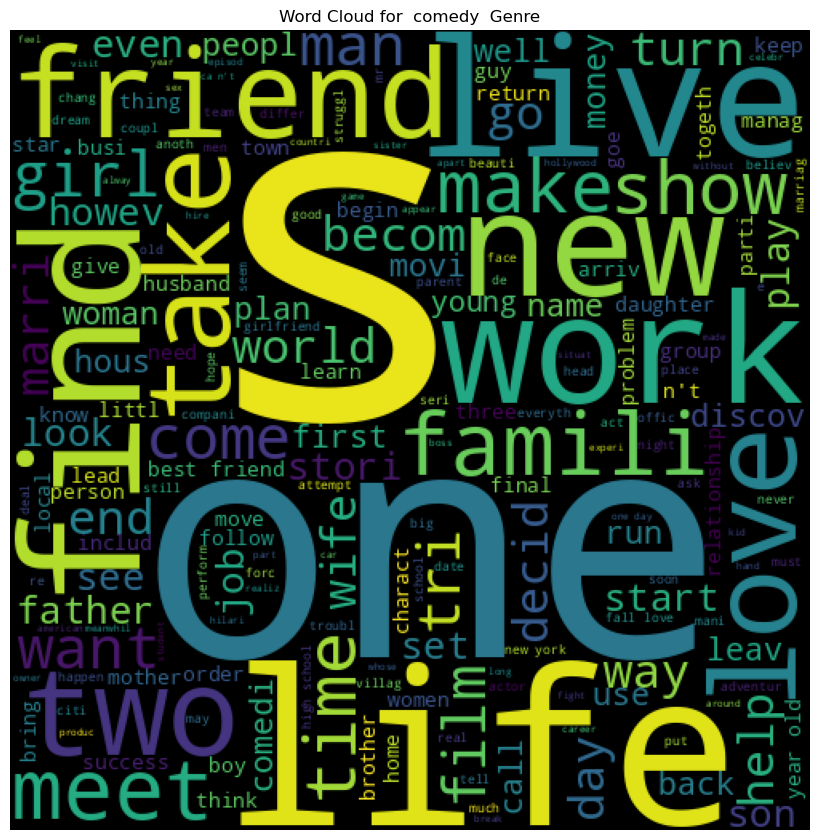

...

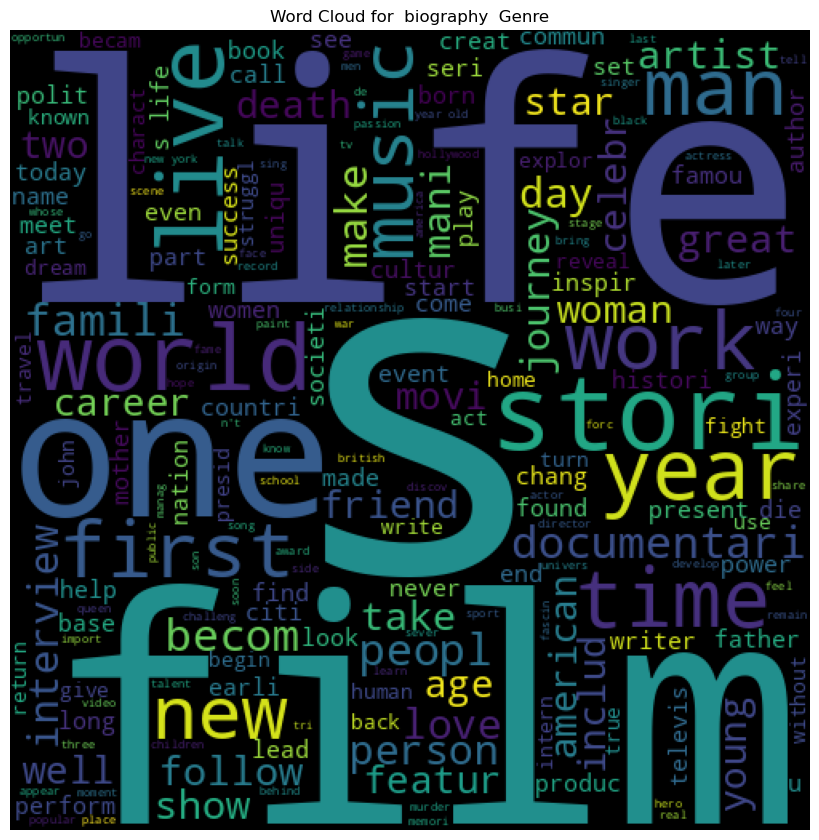

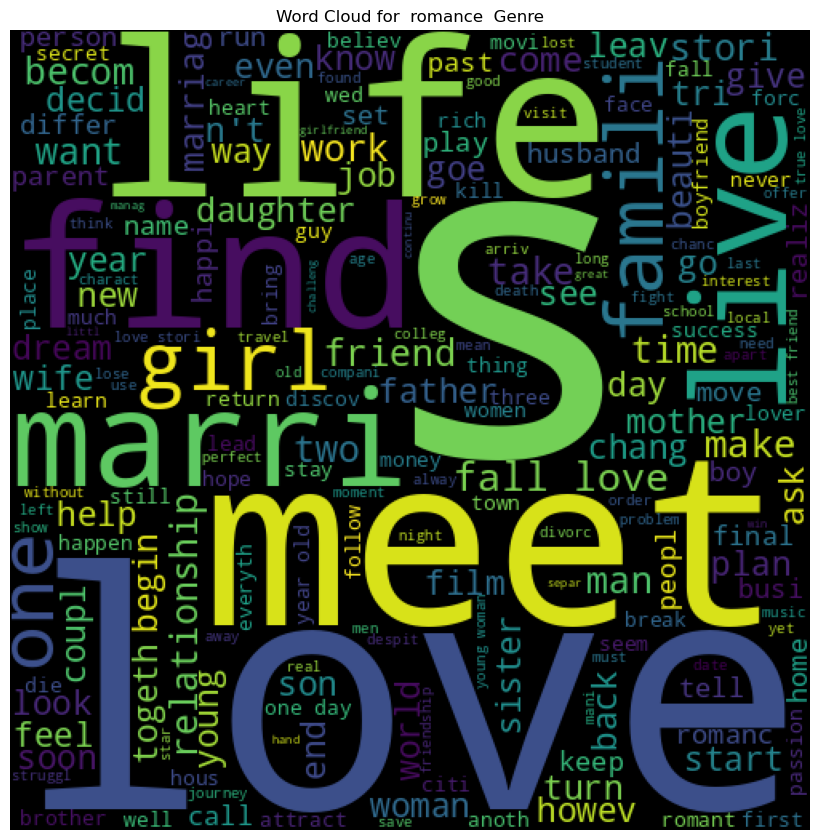

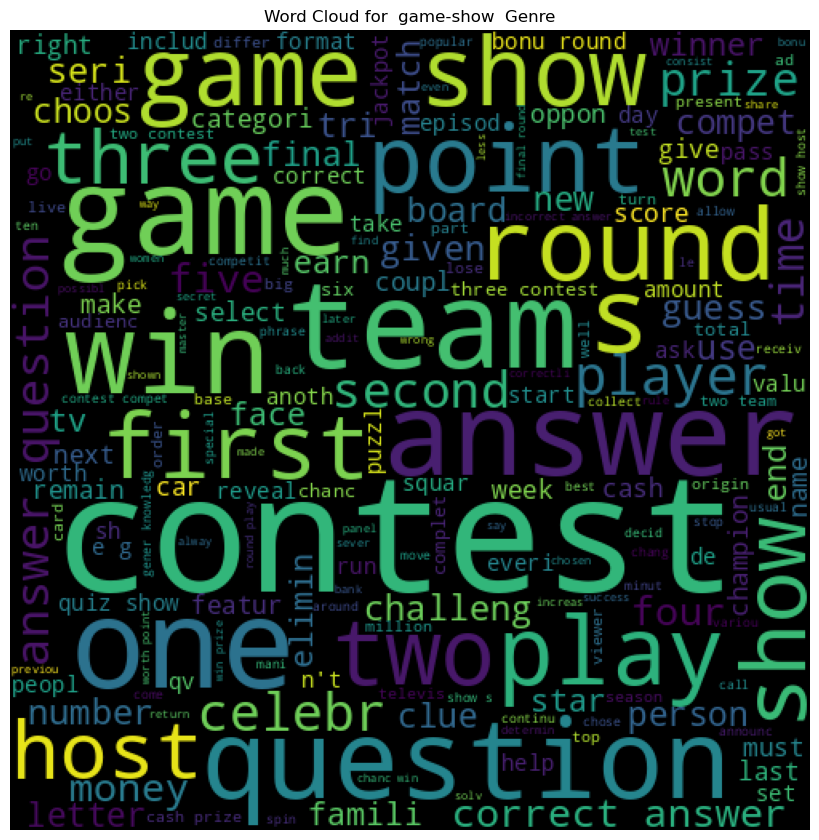

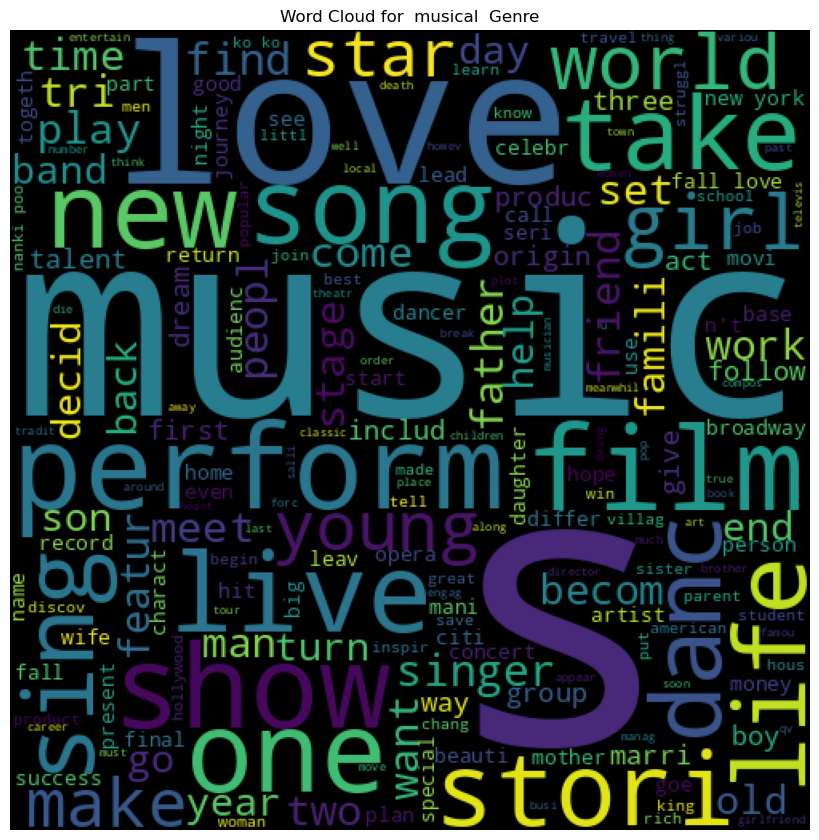

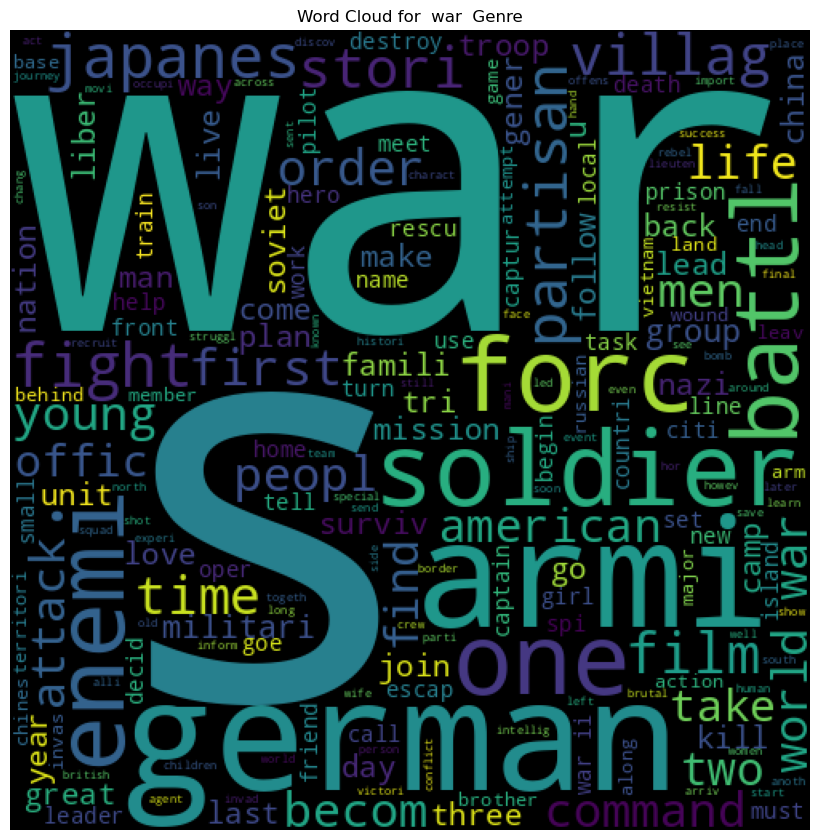

In [13]:
for genre in df['Genre'].unique():
    genre_descriptions = ' '.join(df[df['Genre'] == genre]['Clean Words'])   
    wordcloud = WordCloud(width=500, height=500, background_color='black').generate(genre_descriptions)
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.title(f'Word Cloud for {genre} Genre')
    plt.show()

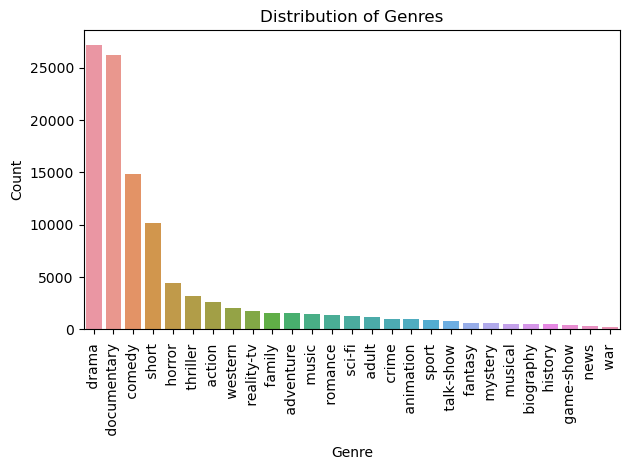

In [14]:
sns.barplot(x=df['Genre'].value_counts().index, y=df['Genre'].value_counts())
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Distribution of Genres')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()

plt.show()

## Merging the labels

In [15]:
def create_genre_new(text):
    cats = [
    ['drama', 'mystery', 'thriller'],
    ['reality-tv', 'short', 'talk-show', 'game-show','family'],
    ['action', 'crime', 'war'],
    ['fantasy', 'sci-fi', 'adventure'],
    ['history', 'news', 'biography','documentary'],
    ['music', 'musical']
    ]
    for cat in cats:
        if text in cat:
            return cat
    return text

In [16]:
def merge_with_pipe(arr):
    if isinstance(arr,list):
        return '|'.join(arr)
    else:
        return "".join(arr)


In [17]:
df['Genre']=df['Genre'].apply(lambda x :  x.strip())

In [18]:
df['genre_new']=df['Genre'].apply(create_genre_new)

In [19]:
df['genre_new'] = df['genre_new'].apply(merge_with_pipe)

In [20]:
df.head()

,Id,Title,Genre,Description,Clean Words,genre_new
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listen convers doctor parent 10 year old oscar...,drama|mystery|thriller
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestu relationship curre...,drama|mystery|thriller
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bu empti student field trip museum natur histo...,adult
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemploy father make end meet edith twin ...,drama|mystery|thriller
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,film 's titl refer un recov bodi ground zero a...,drama|mystery|thriller


In [21]:
df['genre_new'].value_counts()

drama|mystery|thriller                         31043
history|news|biography|documentary             27569
comedy                                         14893
reality-tv|short|talk-show|game-show|family    14648
horror                                          4408
action|crime|war                                3903
fantasy|sci-fi|adventure                        3488
western                                         2064
music|musical                                   2015
romance                                         1344
adult                                           1180
animation                                        996
sport                                            863
Name: genre_new, dtype: int64

In [22]:
len(df['genre_new'].value_counts())

13

# TFIDF

In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report,accuracy_score
from gensim.models import Word2Vec
from sklearn.preprocessing import LabelEncoder
tfidf=TfidfVectorizer(min_df = 5)
encoder=LabelEncoder()

In [24]:
tokenized_sentences = []
for description in df['Clean Words']:
    sentences = sent_tokenize(description)  # Split description into sentences
    for sentence in sentences:
        words = word_tokenize(sentence.lower())  # Tokenize sentence into words
        tokenized_sentences.append(words)

In [25]:
x=df['Clean Words']
y=encoder.fit_transform(df['genre_new'])

In [26]:
y

array([4, 4, 1, ..., 1, 4, 4])

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1,random_state=42)

In [29]:
x_train.shape,x_test.shape

((97572,), (10842,))

In [30]:
x_train=tfidf.fit_transform(x_train)

In [31]:
x_train=x_train.toarray()

In [32]:
x_test=tfidf.transform(x_test).toarray()

In [33]:
from sklearn.naive_bayes import MultinomialNB,GaussianNB,BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [34]:
mnb = MultinomialNB()
rfc = RandomForestClassifier(n_estimators=50, random_state=2)

In [35]:
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score

In [36]:
mnb.fit(x_train,y_train)

MultinomialNB()

In [37]:
mnb_predict=mnb.predict(x_test)

In [38]:
accuracy_score(y_test,mnb_predict)

0.5329275041505257

In [39]:
precision_score(y_test,mnb_predict,average='weighted')

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.5538527934285773

In [40]:
x_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [41]:
rfc.fit(x_train,y_train)

RandomForestClassifier(n_estimators=50, random_state=2)

In [42]:
y_pred_rfc=rfc.predict(x_test)

In [43]:
print(accuracy_score(y_test,y_pred_rfc))
print(precision_score(y_test,y_pred_rfc,average='weighted'))

0.5336653753919941
0.5792869680986702


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [44]:
def get_word_embeddings(text, model):
    embeddings = []
    for word in text:
        if word in model.wv:
            embeddings.append(model.wv[word])
    return embeddings

def get_mean_embeddings(text, model, remove_stopwords=True):
    tokens = word_tokenize(text.lower())
    embeddings = get_word_embeddings(tokens, model)
    if embeddings:
        mean_embedding = np.mean(embeddings, axis=0)
    else:
        mean_embedding = np.zeros(model.vector_size)
    return mean_embedding

In [45]:
word2vec_model = Word2Vec(sentences=tokenized_sentences, vector_size=200, window=5, min_count=1, workers=4)

In [46]:
df['embeddings'] = df['Description'].apply(lambda x: get_mean_embeddings(x, word2vec_model))

In [47]:
x_train_emb,x_test_emb,y_train_emb,y_test_emb=train_test_split(df['embeddings'],y,train_size=0.1,random_state=42)

In [48]:
x_train_emb=np.vstack(x_train_emb)

In [49]:
x_test_emb=np.vstack(x_test_emb)

In [50]:
 gnb_emb=GaussianNB()

In [51]:
gnb_emb.fit(x_train_emb,y_train_emb)

GaussianNB()

In [52]:
gnb_predict=gnb_emb.predict(x_test_emb)

In [53]:
accuracy_score(y_test_emb,gnb_predict)
precision_score(y_test_emb,gnb_predict,average='weighted')

0.394538657514509

In [54]:
rfc_emb=RandomForestClassifier(n_estimators=50, random_state=2)

In [55]:
rfc_emb.fit(x_train_emb,y_train_emb)

RandomForestClassifier(n_estimators=50, random_state=2)

In [56]:
rfc_predict=rfc_emb.predict(x_test_emb)

In [57]:
accuracy_score(y_test_emb,rfc_predict)
precision_score(y_test_emb,rfc_predict,average='weighted')

0.4527946914558838